**Librerias**

In [1]:
import wfdb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.signal import resample
from collections import Counter
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from scipy.signal import argrelextrema

**Funciones**

In [2]:
#Se encarga de extraer para un archivo WFDB dado, el canal específico que incluye
#el vector de datos de la derivación y las anotaciones

#Retorna vector, anotaciones, longitud_muestras

def extrear_derivacion(filename, canal):
    # Leer el archivo de registro y sus anotaciones
    record = wfdb.rdrecord(filename)
    annotation = wfdb.rdann(filename, 'atr') # Cambia 'atr' por la extensión de las anotaciones si es diferente

    # Seleccionar la derivación específica y sus anotaciones correspondientes
    lead_number = canal  # Cambia este número por el índice de la derivación deseada (0 para la primera, 1 para la segunda, etc.)

    selected_lead = record.p_signal[:, lead_number]
    selected_annotation_indices = [i for i in range(len(annotation.sample)) if annotation.chan[i] == lead_number]
    selected_annotations = annotation.sample[selected_annotation_indices]
    selected_symbols = [annotation.symbol[i] for i in selected_annotation_indices]
    selected_aux_note = [annotation.aux_note[i] for i in selected_annotation_indices]

    # Crear un nuevo objeto de registro y anotaciones con solo la derivación deseada y sus anotaciones
    selected_record = wfdb.Record(record_name=record.record_name, fs=record.fs, n_sig=1,
                                  sig_len=len(selected_lead), p_signal=selected_lead.reshape(-1, 1),
                              units=[record.units[lead_number]], sig_name=[record.sig_name[lead_number]])

    selected_annotation = wfdb.Annotation(record_name=annotation.record_name, extension=annotation.extension,
                                      sample=selected_annotations, symbol=selected_symbols,
                                      aux_note=selected_aux_note, chan=[0] * len(selected_annotations),
                                      num=len(selected_annotations), fs=annotation.fs)

    
    # Longitud en número de muestras de cada señal
    signal_length = record.sig_len

    return selected_record, selected_annotation, signal_length

In [3]:
#Permite graficar el contenido del vector y anotación, para un intervalo de tiempo en segundos
#especificado como start_time, end

def graficar(rec, ann, start_time, end):
    # Define el intervalo de tiempo en segundos que deseas graficar
    # Convertir los tiempos a índices
    start_index = int(start_time * rec.fs)
    end_index = int(end * rec.fs)

    # Acotar el intervalo de tiempo de la señal y las anotaciones
    time = np.arange(start_index, end_index) / rec.fs
    signal = rec.p_signal[start_index:end_index]
    ann_indices = (ann.sample >= start_index) & (ann.sample < end_index)
    ann_sample = ann.sample[ann_indices] - start_index
    ann_symbol = np.array(ann.symbol)[ann_indices]

    # Graficar la señal y las anotaciones
    fig, ax = plt.subplots(figsize=(15, 8))
    ax.plot(time, signal)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel(f"{rec.sig_name[0]} ({rec.units[0]})")

    for s, x in zip(ann_symbol, ann_sample):
        ax.annotate(s, xy=((x / rec.fs) + start_time, signal[x]), xycoords='data', textcoords='data',
                    arrowprops=dict(facecolor='red', arrowstyle="wedge,tail_width=0.7", alpha=0.8),
                    fontsize=12, color='red', alpha=0.8)

    plt.show()

In [4]:
def process_ecg_signal2(rec, ann, segment_length=10, multiplier=1.2, new_fs=125, new_length=187):
    fs = rec.fs
    segment_samples = segment_length * fs
    n_segments = rec.sig_len // segment_samples
    p_signal = rec.p_signal

    segments = []
    labels = []
    periodo = []
    segments_ = []

    for i in range(n_segments):
        start_sample = i * segment_samples
        end_sample = (i + 1) * segment_samples

        # Extraer y normalizar el segmento de 10 segundos
        segment = p_signal[start_sample:end_sample]
        normalized_segment = (segment - np.min(segment)) / (np.max(segment) - np.min(segment))

        # Encontrar las anotaciones y calcular T dentro del segmento de 10 segundos
        ann_indices = (ann.sample >= start_sample) & (ann.sample < end_sample)
        ann_sample = ann.sample[ann_indices] - start_sample
        ann_symbol = np.array(ann.symbol)[ann_indices]
        T = np.mean(np.diff(ann_sample))
        
        periodo.append(T*multiplier)

        # Iterar las anotaciones en el segmento de 10 segundos
        for j, (s, x) in enumerate(zip(ann_symbol, ann_sample)):
            # Extraer T*1.2 muestras a la derecha a partir de la posición de la anotación
            #start_subsample = x -5
            #end_subsample = min(x -5 + int(T * multiplier), end_sample - start_sample)
            
            start_subsample = x - int(T*0.5)
            end_subsample = min(x + int(T*0.7), end_sample - start_sample)
            
            subsegment = normalized_segment[start_subsample:end_subsample]

            # Rellenar con ceros hasta 1600 muestras
            subsegment_400 = np.zeros(1600)
            subsegment_400[:len(subsegment.flatten())] = subsegment.flatten()


            # Remuestrear a 125 Hz y interpolar para obtener un vector de longitud 187
            #subsegment_125 = resample(subsegment_360, int(fs/new_fs * len(subsegment_360)))
            #f = interp1d(np.linspace(0, 1, num=len(subsegment_125)), subsegment_125, kind='cubic')
            #subsegment_out = f(np.linspace(0, 1, num=new_length))

            segments.append(subsegment_400)
            segments_.append(subsegment)
            
            labels.append(s)

    return segments, labels, periodo, segments_


In [5]:
def plot_filtered_segments(segments, labels, target_label, num_to_plot, file):
    filtered_segments = [seg for seg, label in zip(segments, labels) if label == target_label]

    fig, ax = plt.subplots(figsize=(15, 4))
    for i in range(min(num_to_plot, len(filtered_segments))):
        ax.plot(filtered_segments[i])

    ax.set_ylabel('Amplitud normalizada')
    ax.set_xlabel('Muestras de ' + file)
    #ax.legend(loc='upper right')
    #plt.tight_layout()
    plt.show()




In [6]:
def resample_vector(vector, old_fs, new_fs):
    segment_resample = vector;

    # Definir la frecuencia de muestreo original y la deseada
    frecuencia_original = 250
    frecuencia_deseada = 125

    # Calcular el factor de reescalado
    factor_reescalado = frecuencia_original / frecuencia_deseada

    # Remuestrear los datos
    #datos_125Hz = np.resample(datos_1000Hz, int(len(datos_1000Hz)/factor_reescalado))

    #new_fs = 125 # Nueva frecuencia de muestreo
    for i in range(len(segment_resample)):
        #new_length = int(187 * new_fs / 360)
        subsegment_125 = resample(segment_resample[i], int(len(segment_resample[i])/factor_reescalado))
        segment_resample[i] = subsegment_125[:187]
        
    return segment_resample


In [7]:
def padding(lista):
    segments_padded = []
    desired_length = 187

    for segment in lista:
        # obtener la longitud actual del segmento
        current_length = len(segment)

        # calcular la cantidad de ceros que se necesitan agregar
        n_zeros = desired_length - current_length

        # agregar los ceros al final del segmento
        padded_segment = np.pad(segment, (0, n_zeros), 'constant')

        # agregar el segmento acolchado a la lista
        segments_padded.append(padded_segment)
        
    return segments_padded


In [8]:
def procesar(guardarComo, file, muestras, tipo, factor, grafica_periodo = False):
    filename = './dataset/dataset-modelo/'+file
    rec, ann, longitud = extrear_derivacion(filename, 0)
    segments, labels, periodo, analizar = process_ecg_signal2(rec, ann, 10, factor)
    
    if grafica_periodo == True:
        plt.plot(periodo)
        plt.show()
    
    label_counts = Counter(labels)
    print("Conteo de etiquetas:", label_counts)
    
    segments_resample = resample_vector(segments, 360, 125)
    
    #segmento_ajustado = padding(segments_resample)
    
    target_label = tipo  # Cambia esto por la etiqueta que deseas filtrar
    num_to_plot = muestras     # Cambia esto por la cantidad de segmentos que deseas graficar
    plot_filtered_segments(segments_resample, labels, target_label, num_to_plot, file)
    
    # Crear un DataFrame a partir de la lista 'segmentos'
    df = pd.DataFrame(segments_resample)

    # Agregar una nueva columna con las etiquetas en la lista 'etiquetas'
    df['etiqueta'] = labels

    # Guardar el DataFrame inicial en un archivo CSV
    df.to_csv(guardarComo, mode='a', index=False, header=False)
    
    return df


In [9]:
def lista(num_inicial, num_final):
    # Generar una lista de cadenas de 3 dígitos
    numeros = [str(i) for i in range(num_inicial, num_final+1)]

    return numeros


In [10]:
def reetiquetado(df):
    # Crear un diccionario de mapeo para agrupar las categorías
    mapeo_categorias = {
        'N': 'N', 'L': 'N', 'R': 'N', 'e': 'N', 'j': 'N',
        'A': 'S', 'a': 'S', 'J': 'S', 'S': 'S',
        'V': 'V', 'E': 'V', 'F': 'V',
        'F': 'F',
        '/': 'Q', 'f': 'Q', 'Q': 'Q'
    }

    # Aplicar el mapeo de categorías a la columna 188
    df[187] = df[187].map(mapeo_categorias)

    return df

In [11]:
def etiqueta_numerica(df):
    # Diccionario de mapeo de etiquetas a números
    mapeo_numerico = {
        'N': 0,
        'Q': 4,
        'V': 2,
        'S': 1,
        'F': 3
    }

    # Aplicar el mapeo de etiquetas a números a la columna '188'
    df[187] = df[187].map(mapeo_numerico)

    return df

In [12]:
def proporcion_ceros(fila):
    total_ceros = sum(fila == 0)
    total_elementos = len(fila)
    return total_ceros / total_elementos


**Proceso para segmentar el datset de Physionet**

https://physionet.org/content/mitdb/1.0.0/

The recordings were digitized at 360 samples per second per channel with 11-bit resolution over a 10 mV range. Two or more cardiologists independently annotated each record; disagreements were resolved to obtain the computer-readable reference annotations for each beat (approximately 110,000 annotations in all) included with the database.

**Crea la lista con los nombres de los archivos originales del dataset**

Se crea una lista con los nombre de todos los archivos que se descargaron
como base de datos de trazos de ECG

In [13]:
lista_archivos = lista(100,109) + lista(111,119) + lista(121,124) + \
        lista(200,203) + ['205'] + lista(207,210) + lista(212,215) + \
        ['217'] + lista(219,223) + ['228'] + lista(230,234)
print(lista_archivos)

['100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '111', '112', '113', '114', '115', '116', '117', '118', '119', '121', '122', '123', '124', '200', '201', '202', '203', '205', '207', '208', '209', '210', '212', '213', '214', '215', '217', '219', '220', '221', '222', '223', '228', '230', '231', '232', '233', '234']



**Extracción de los segmentos de latidos**

In [14]:
#definimos el nombre del archivo en donde se van a integrar 
#todos los segmentos que se extraen de la base de datos

dataset_guardar = 'dataset_mit_bih_arrhythmia.csv'

**Metdología para el preprocesamiento de la base de datos**

a) Se selecciona el archivo de la base de datos Physionet MIT-BIH Arrhythmia.

b) El archivo puede contener más de una derivación, por lo que selecciona la Derivación II que proporciona la información más relevente del trazo de ECG. El vector que se extrae es de tipo "record" junto con un vector tipo "annotation", que tiene las etiquetas generadas por los cardiólogos que revisaron el archivo.

La siguiente imagen muestra un ejemplo del contenido de un archivo de la base de datos.

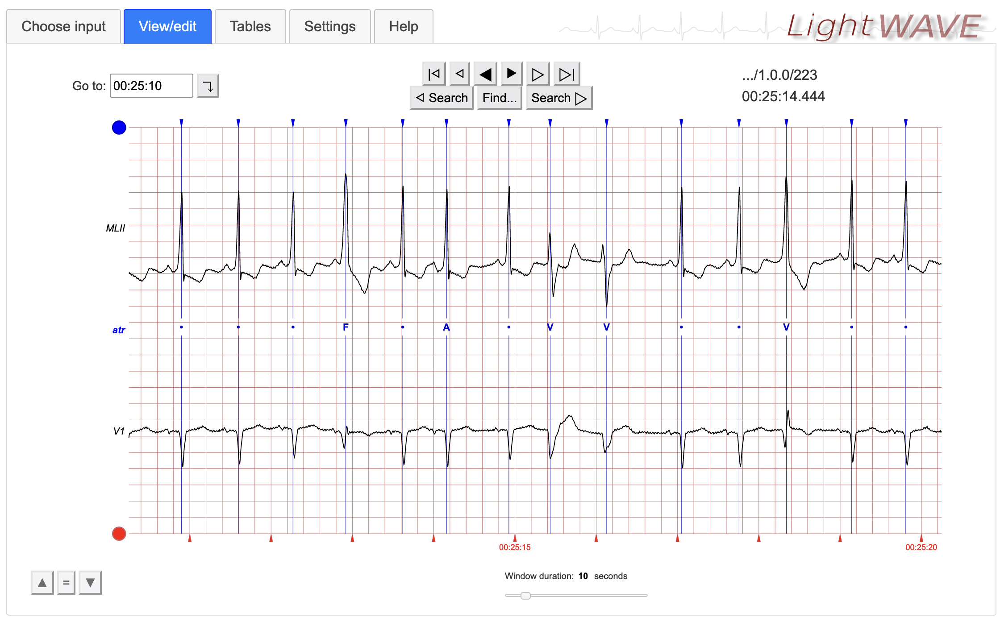

c) Se recorrerá el archivo extrayendo bloques de 10 segundos de información.

d) El bloque de 10 segundos se normaliza entre valores 0 y 1

e) Utilizando las anotaciones generadas por los cardiólogos en cada uno de los latidos, se calcula la media de la frecuencia cardiaca en los 10 segundos. Esta frecuencia media, se utilizará como la ventana para segmentar un latido. Es decir, de la posicion del latido, se tomara ventana * 0.5 muestras a la izquierda y ventana * 0.7 muestras a la derecha. La proporción obedece a la distribución característica de un latido de corazón.

f) Se tomarán solamente los latidos que cumplan con su ventana de datos completa. Esto es, posiblemente algunos latidos que se encuentren en los extremos izquierda y derecha, podrán quedar excluidos por no tener información completa.

g) Se extraerán los N latidos que se identifiquen en el bloque de 10 segundos, utilizando las posiciones de las etiquetas hechas por los cardiólogos. 

h) Cada uno de los latidos que se extraen, fueron generados a 360Hz. Para simplificar la cantidad de datos, se baja el muestreo a 125Hz, que permite continuar manteniendo las características relevantes de la morfología del latido.

i) En la diversidad de estudios de la base de datos, existen diferentes frecuencias cardiacas de los pacientes. Esto significa, que la frecuencia media que se calculó en el paso e) arrojará una ventana de datos que puede ir desde unas 75 muestras (frecuencia cardiaca alta) hasta poco más de 175 muestras (frecuencia cardiaca baja). Por ello se estandariza una longitud de vector a 187 muestras para todos los latidos.

A continuación se muestran ejemplos del resultado de la segmentación de diferentes archivos, mostrando un grupo de latidos de tipo 'N'. Esta clase se explica en el punto k)

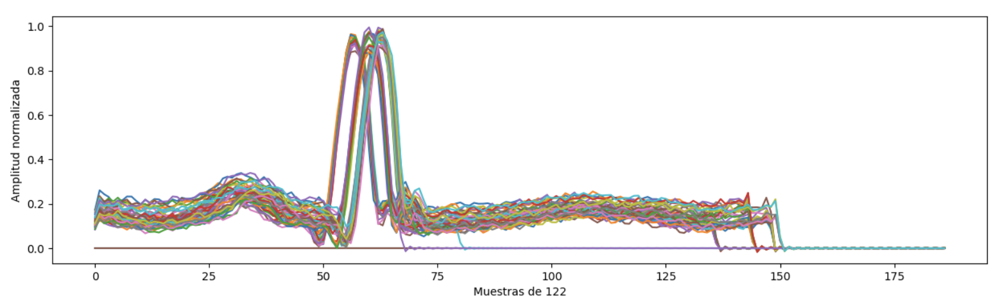

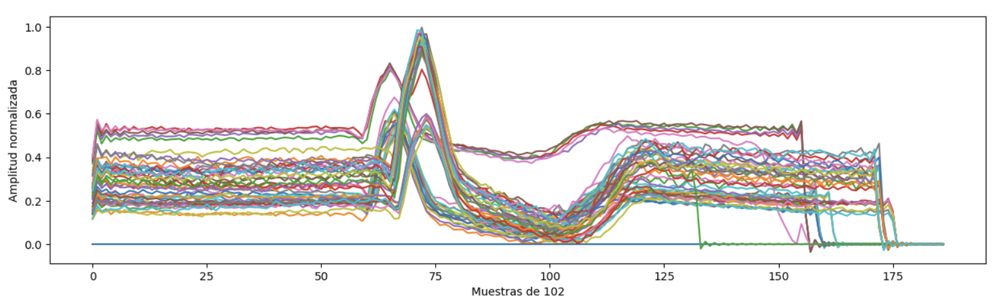

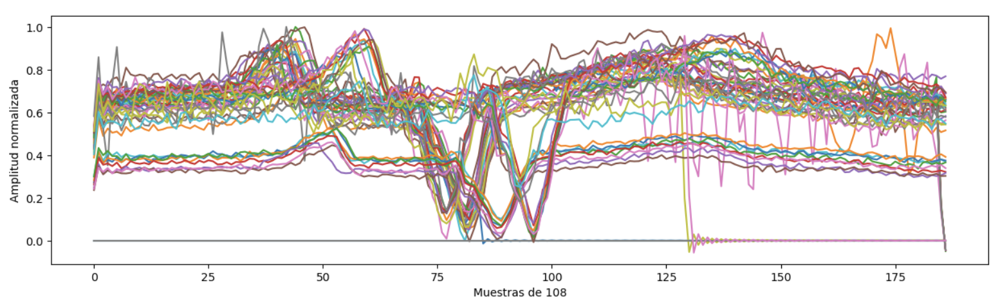

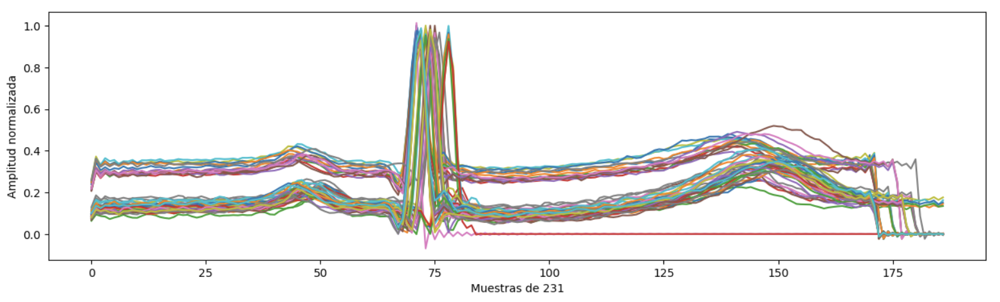

j) Para cada uno de los latidos que se segmentó, se unifica la longitud de 187 muestras rellenando con ceros los datos faltantes. Esto para no influir en la morfología del trazo.

k) Cada uno de los latidos segmentados, se etiqueta con la anotación que generaron los cardiólogos (MIT-BIH Class) que indica un tipo de latido específico.

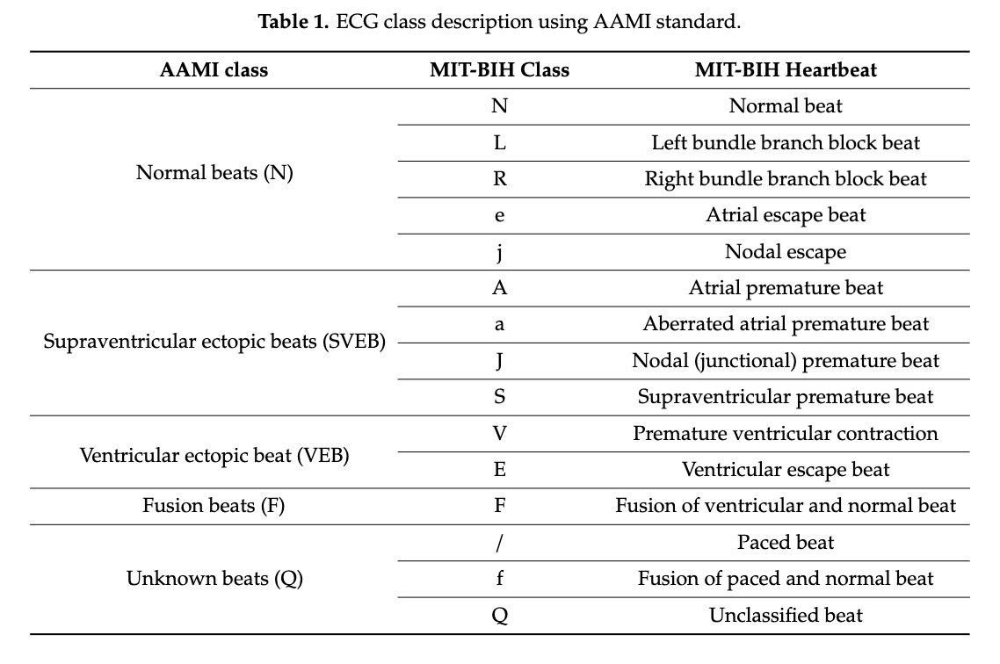

l) Lo anterior nos arrojará un dataset de latidos segmentados con hasta 15 posibles clases de latidos.

m) Hasta aquí, ha quedado un dataset de las siquientes características.

Total de latidos segmentados: 112,299

Clases de latidos encontrados y cantidades: 

'N': 74804, 'L': 8055, 'R': 7241, 'V': 7116, '/': 7005, 'A': 2530, '+': 1289, 'f': 979, 'F': 802 , '~': 615, '!': 472, '"': 437, 'j': 229, 'x': 192, 'a': 149, '|': 132, 'E': 106, 'J': 83, 'Q': 33, 'e': 16, '[': 6, ']': 6, 'S': 2

Conteo de etiquetas: Counter({'N': 2231, 'A': 33, '+': 1, 'V': 1})


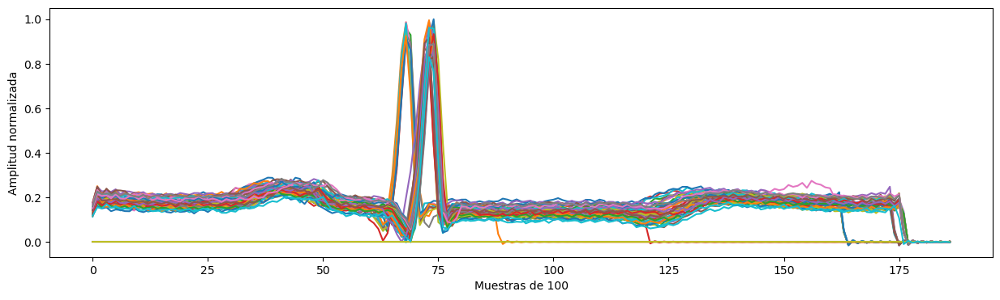

Conteo de etiquetas: Counter({'N': 1855, '~': 4, '|': 4, 'A': 3, 'Q': 2, '+': 1})


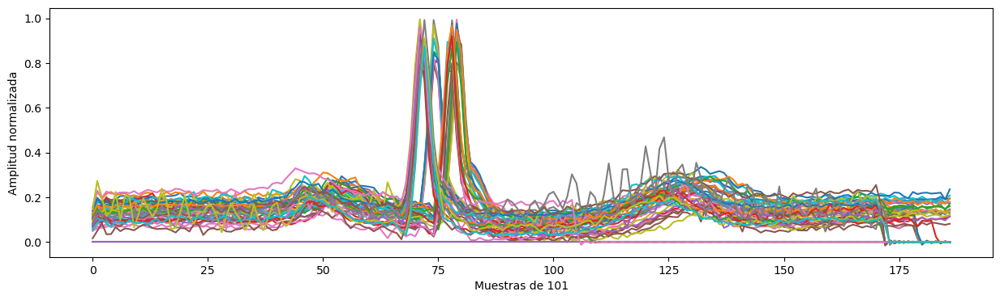

Conteo de etiquetas: Counter({'/': 2023, 'N': 99, 'f': 54, '+': 5, 'V': 4})


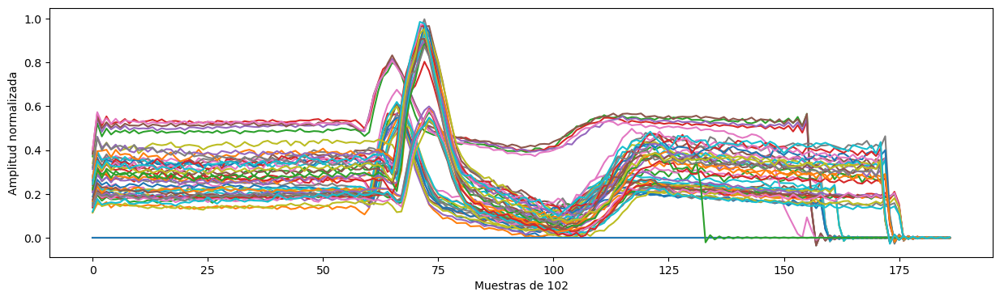

Conteo de etiquetas: Counter({'N': 2076, '~': 6, 'A': 2, '+': 1})


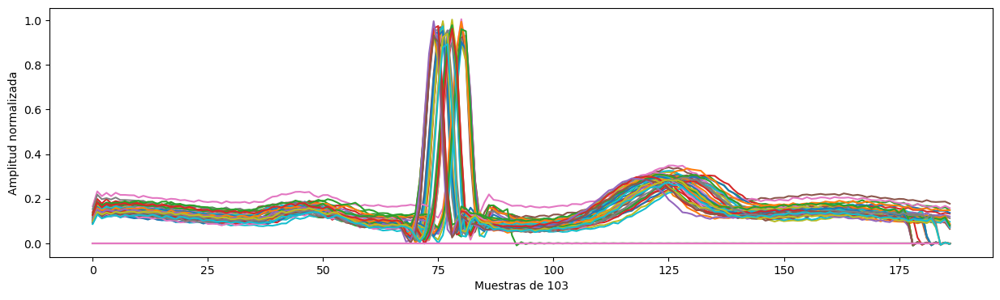

Conteo de etiquetas: Counter({'/': 1374, 'f': 665, 'N': 163, '+': 45, '~': 37, 'Q': 18, 'V': 2})


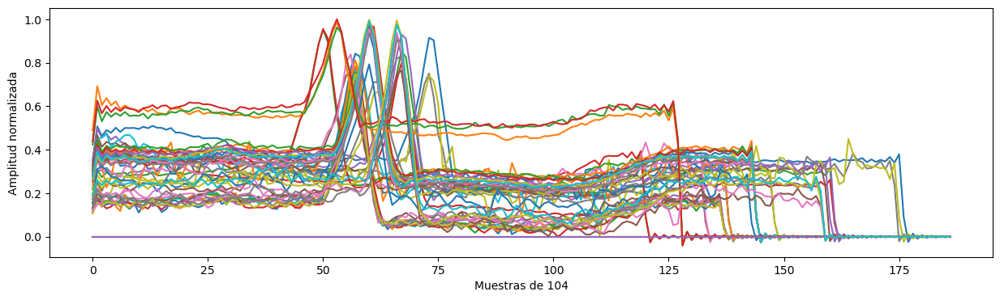

Conteo de etiquetas: Counter({'N': 2519, '~': 88, 'V': 41, '|': 30, 'Q': 5, '+': 1})


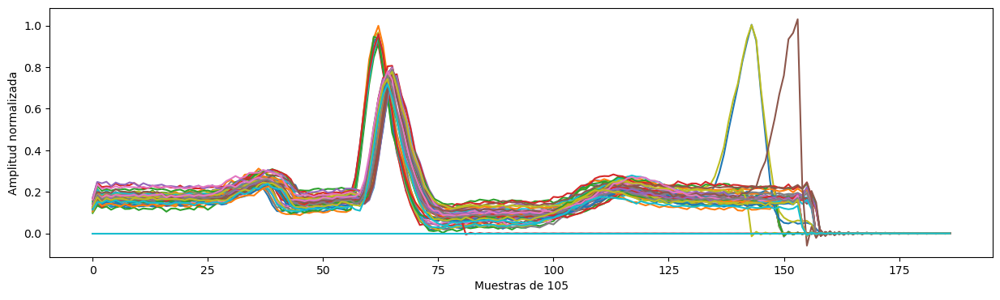

Conteo de etiquetas: Counter({'N': 1503, 'V': 518, '+': 41, '~': 30})


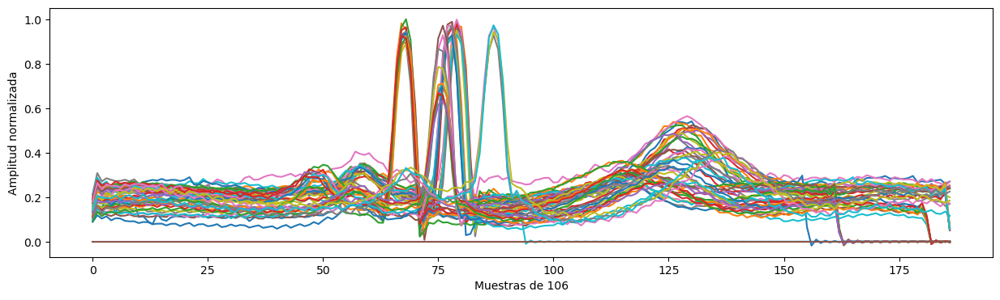

Conteo de etiquetas: Counter({'/': 2072, 'V': 59, '~': 2, '+': 1})


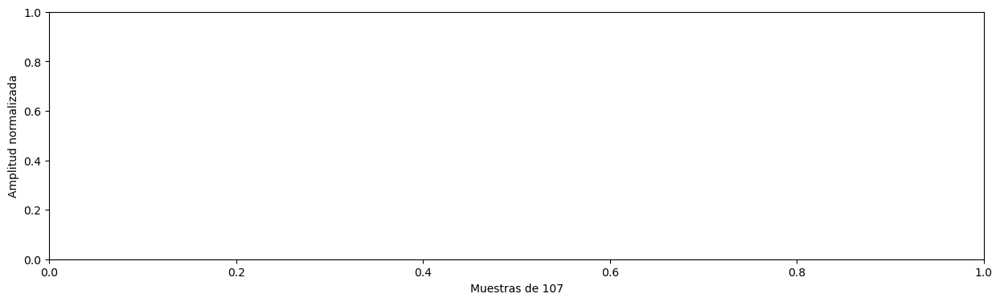

Conteo de etiquetas: Counter({'N': 1733, '~': 41, 'V': 17, 'x': 11, '|': 8, 'A': 4, 'F': 2, '+': 1, 'j': 1})


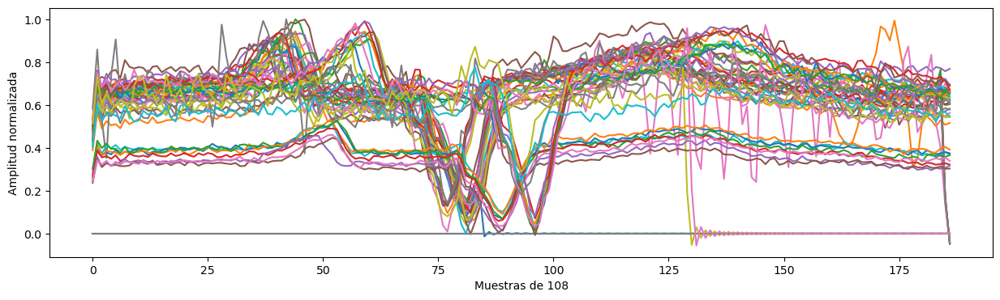

Conteo de etiquetas: Counter({'L': 2485, 'V': 37, 'F': 2, '~': 2, '+': 1})


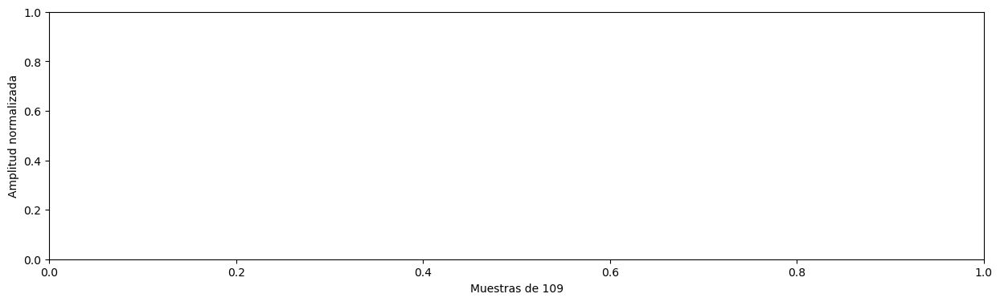

Conteo de etiquetas: Counter({'L': 2117, '~': 8, '+': 1, 'V': 1})


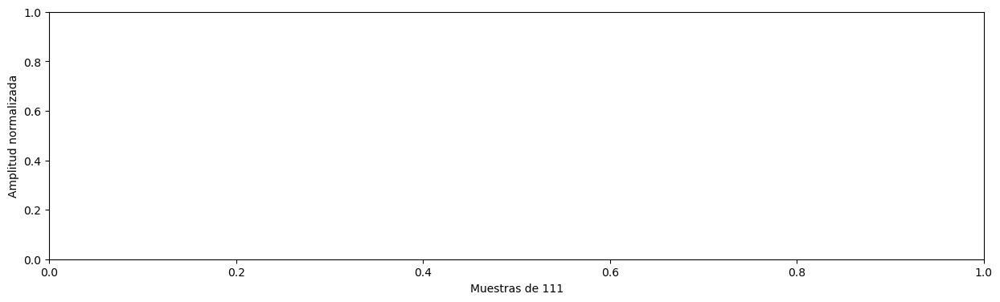

Conteo de etiquetas: Counter({'N': 2529, '~': 10, 'A': 2, '+': 1})


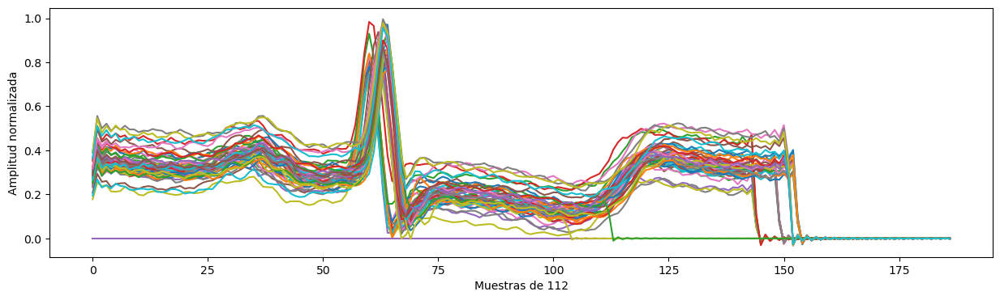

Conteo de etiquetas: Counter({'N': 1783, 'a': 6, '+': 1})


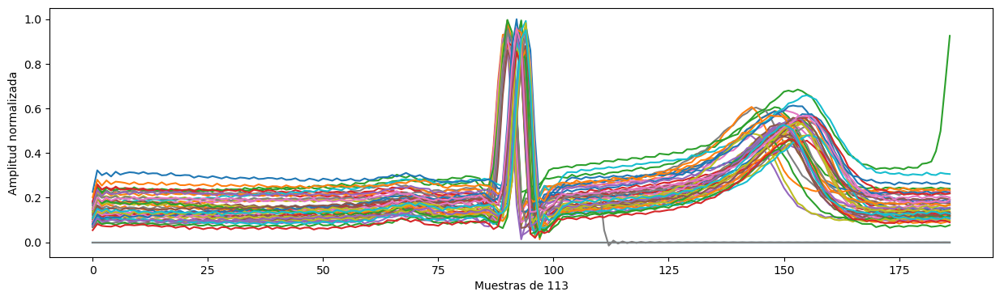

Conteo de etiquetas: Counter({'N': 1813, 'V': 43, 'A': 10, '~': 7, 'F': 4, '+': 3, 'J': 2, '|': 1})


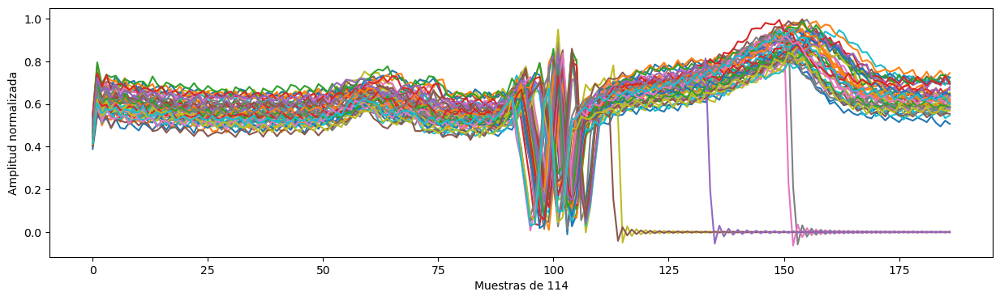

Conteo de etiquetas: Counter({'N': 1946, '|': 6, '~': 2, '+': 1})


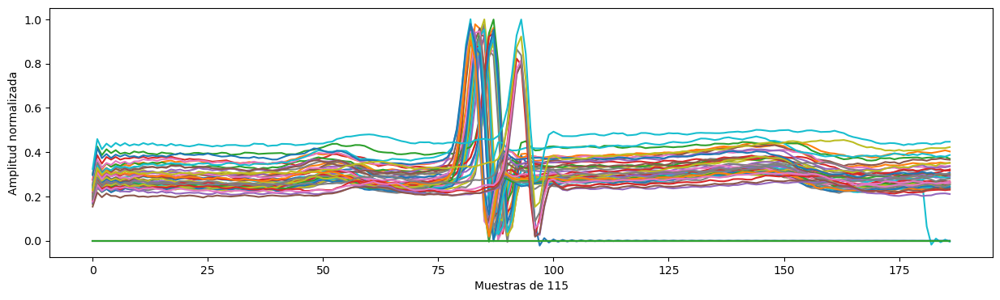

Conteo de etiquetas: Counter({'N': 2294, 'V': 109, '~': 8, '+': 1, 'A': 1})


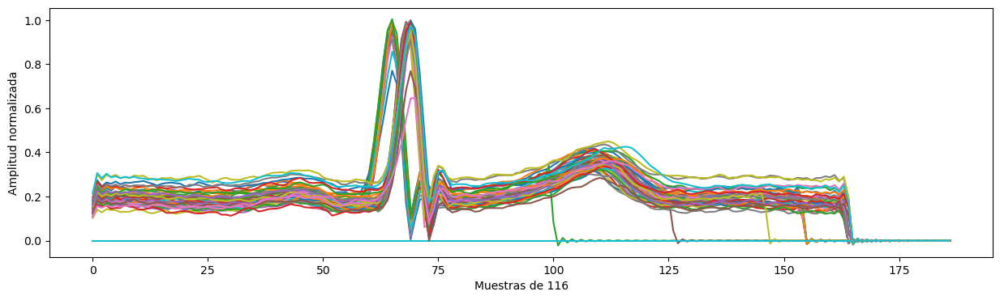

Conteo de etiquetas: Counter({'N': 1529, '~': 3, '+': 1, 'A': 1})


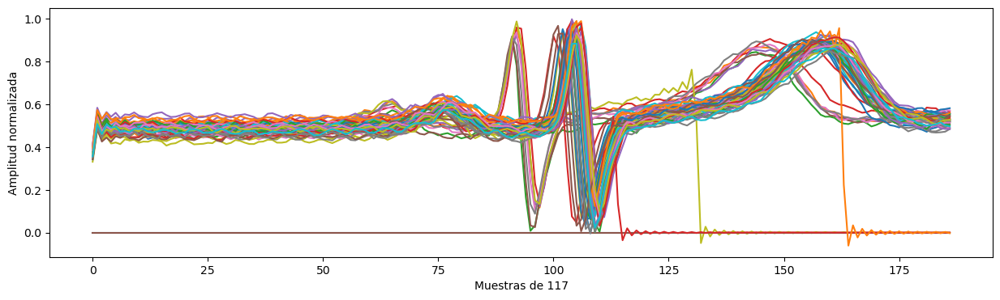

Conteo de etiquetas: Counter({'R': 2161, 'A': 94, 'V': 16, '~': 12, 'x': 10, '+': 1})


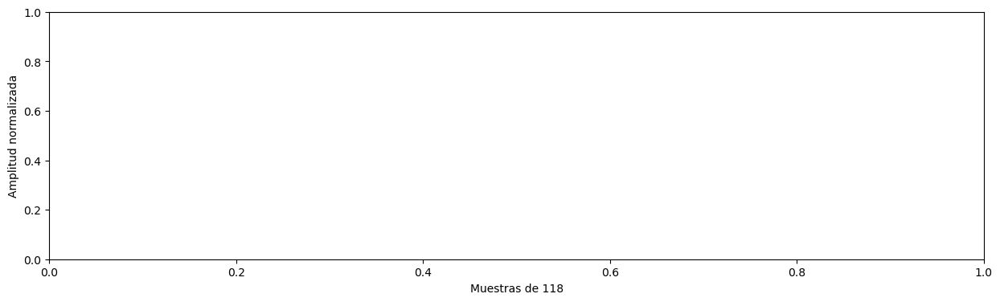

Conteo de etiquetas: Counter({'N': 1537, 'V': 444, '+': 103, '~': 4})


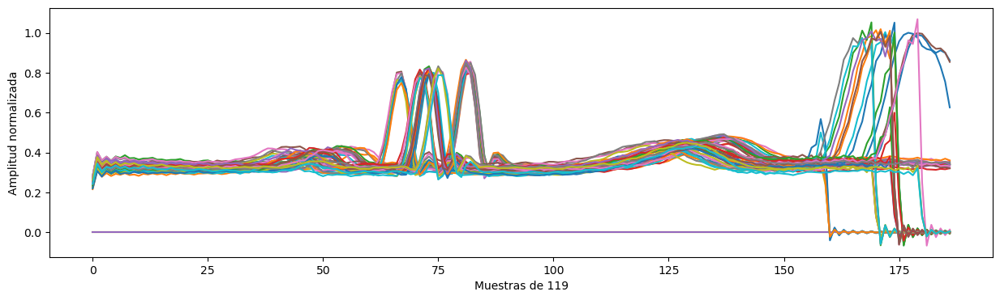

Conteo de etiquetas: Counter({'N': 1854, '~': 12, '+': 1, 'A': 1, 'V': 1})


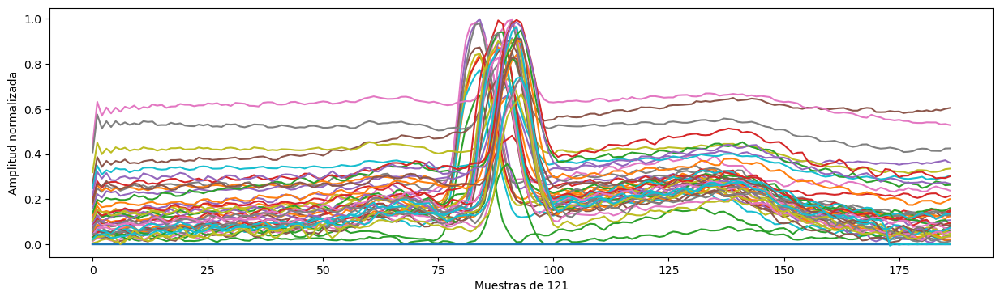

Conteo de etiquetas: Counter({'N': 2468, '|': 2, '+': 1})


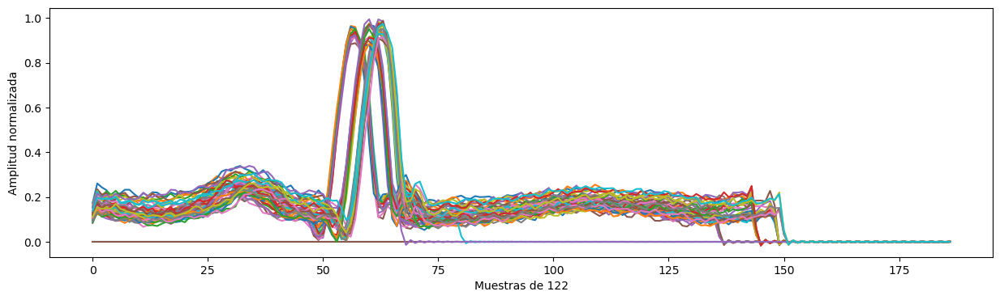

Conteo de etiquetas: Counter({'N': 1510, 'V': 3, '+': 1})


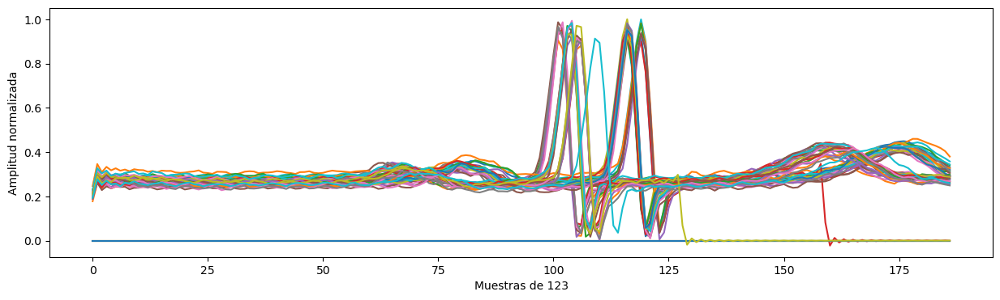

Conteo de etiquetas: Counter({'R': 1525, 'V': 47, 'J': 29, '+': 13, 'F': 5, 'j': 5, 'A': 2, '~': 2})


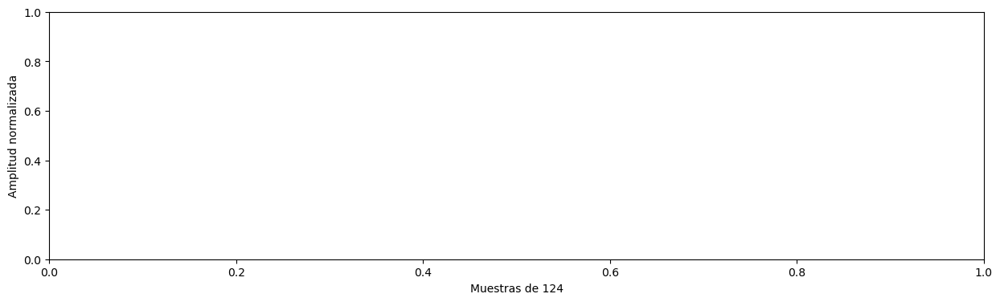

Conteo de etiquetas: Counter({'N': 1735, 'V': 826, '+': 148, '~': 42, 'A': 30, 'F': 2})


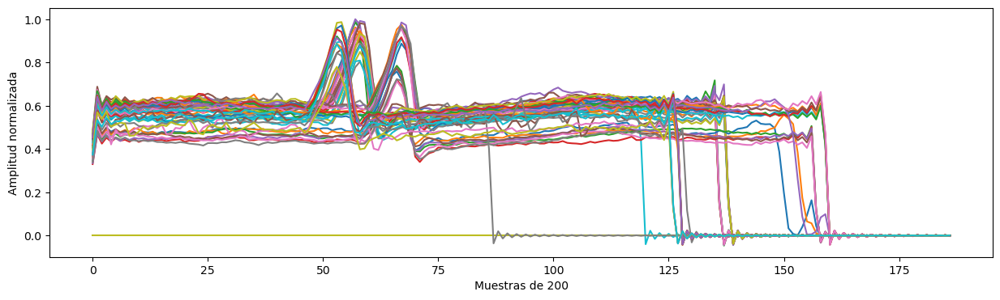

Conteo de etiquetas: Counter({'N': 1622, 'V': 198, 'a': 96, 'x': 36, '+': 35, 'A': 30, 'j': 10, '~': 4, 'F': 2, 'J': 1})


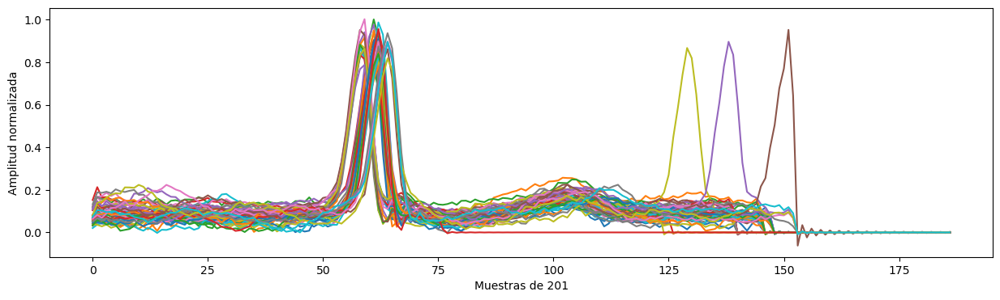

Conteo de etiquetas: Counter({'N': 2053, 'A': 36, 'V': 19, 'a': 19, '+': 8, '|': 2, 'F': 1})


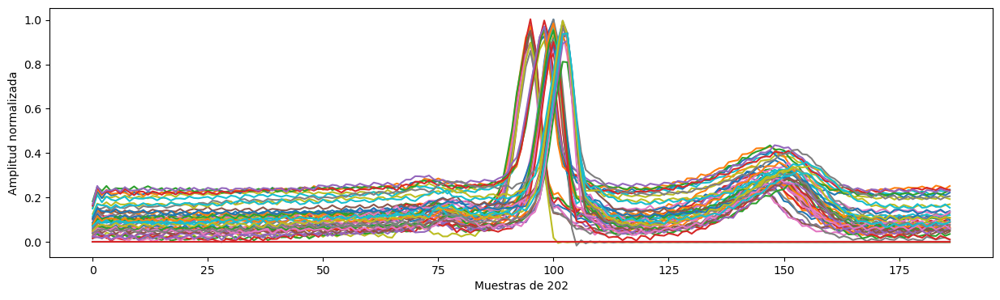

Conteo de etiquetas: Counter({'N': 2522, 'V': 444, '~': 57, '+': 45, '|': 26, 'Q': 4, 'a': 2, 'F': 1})


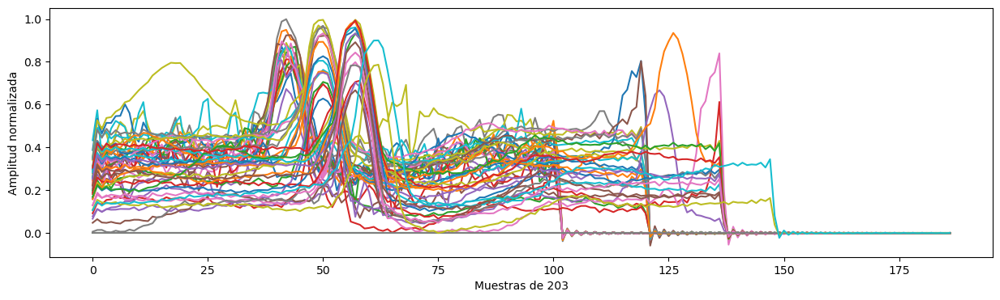

Conteo de etiquetas: Counter({'N': 2563, 'V': 71, '+': 13, 'F': 11, 'A': 3, '~': 2, '|': 1})


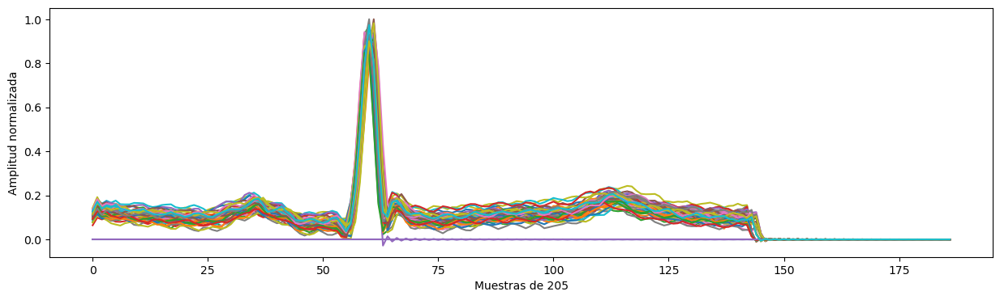

Conteo de etiquetas: Counter({'L': 1457, '!': 472, 'V': 105, 'E': 105, 'A': 97, 'R': 86, '+': 24, '~': 15, '[': 6, ']': 6, '|': 2})


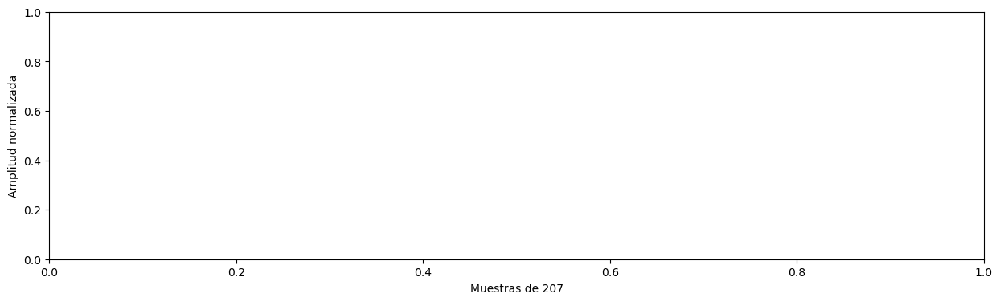

Conteo de etiquetas: Counter({'N': 1581, 'V': 989, 'F': 372, '+': 53, '~': 24, '|': 8, 'S': 2, 'Q': 2})


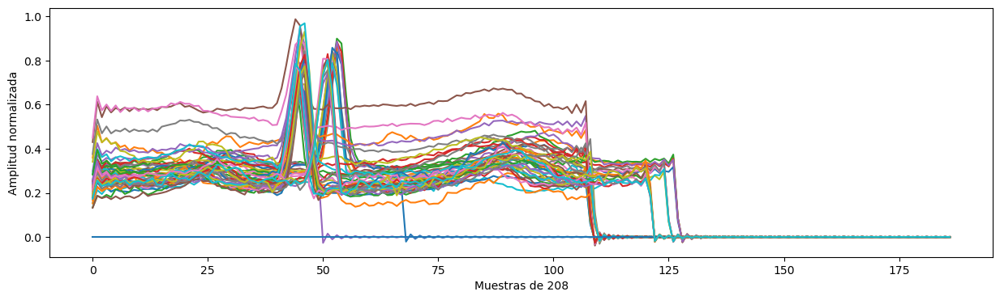

Conteo de etiquetas: Counter({'N': 2613, 'A': 383, '+': 21, '~': 19, '|': 7, 'V': 1})


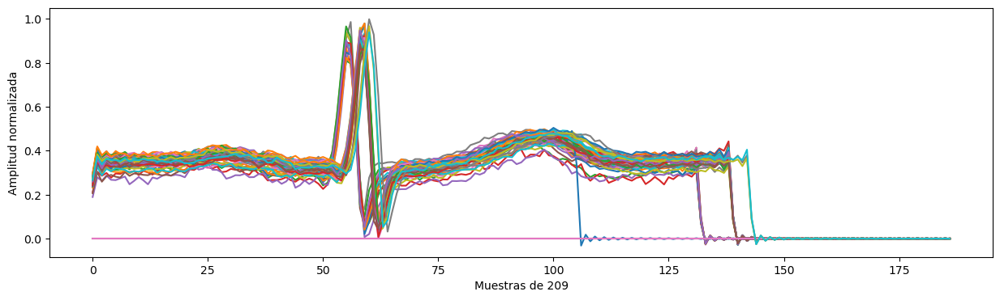

Conteo de etiquetas: Counter({'N': 2417, 'V': 192, 'a': 22, '+': 17, '~': 17, 'F': 10, '|': 1, 'E': 1})


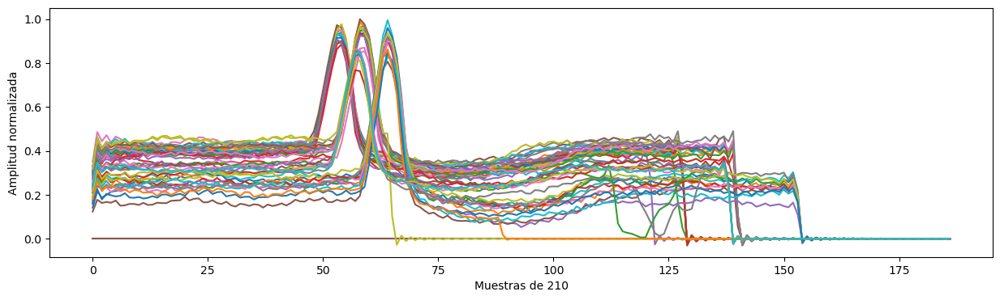

Conteo de etiquetas: Counter({'R': 1825, 'N': 915, '~': 13, '+': 1, '|': 1})


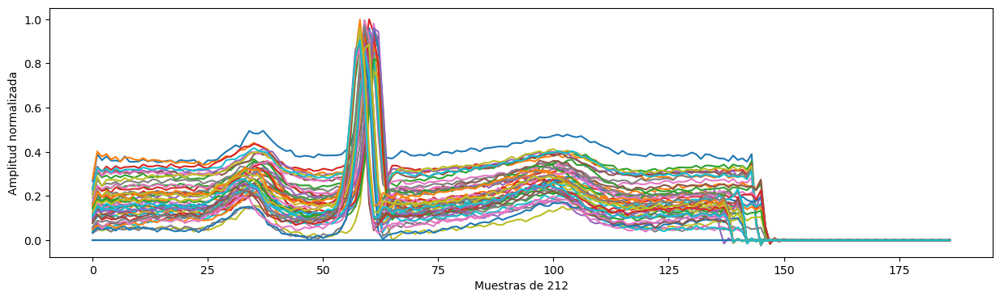

Conteo de etiquetas: Counter({'N': 2632, 'F': 362, 'V': 220, '+': 43, 'A': 24, 'a': 3})


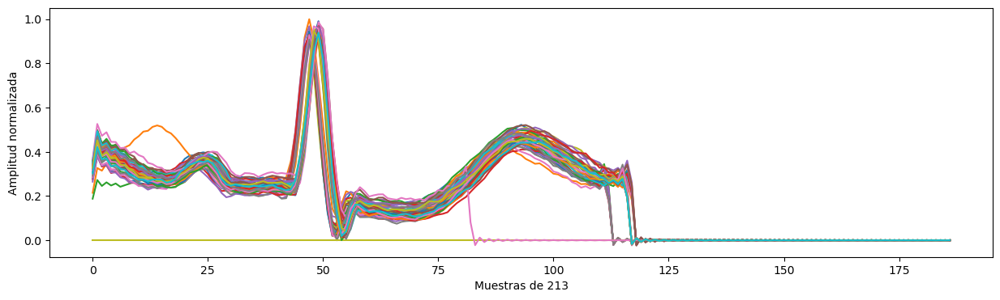

Conteo de etiquetas: Counter({'L': 1996, 'V': 255, '+': 24, '|': 5, '~': 4, 'Q': 2, '"': 1, 'F': 1})


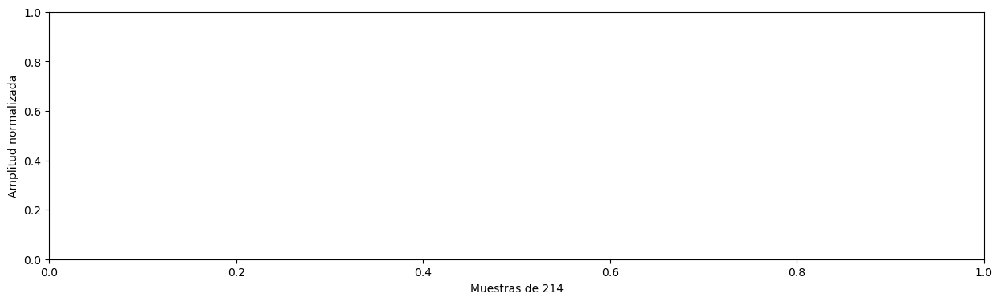

Conteo de etiquetas: Counter({'N': 3185, 'V': 164, '~': 30, '+': 5, 'A': 3, '"': 2, 'F': 1})


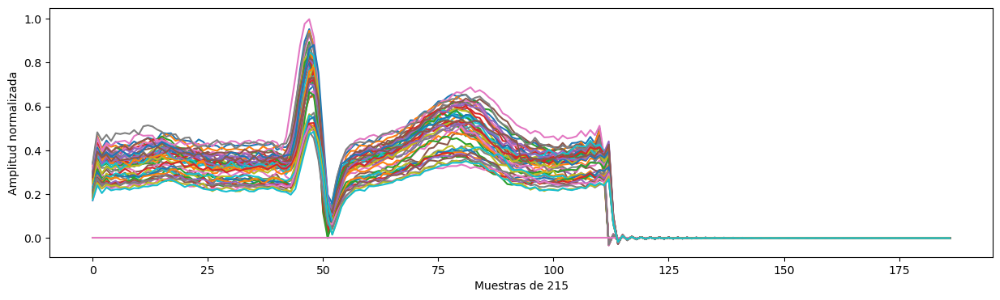

Conteo de etiquetas: Counter({'/': 1536, 'f': 260, 'N': 244, 'V': 162, '+': 67, '~': 4, '|': 1})


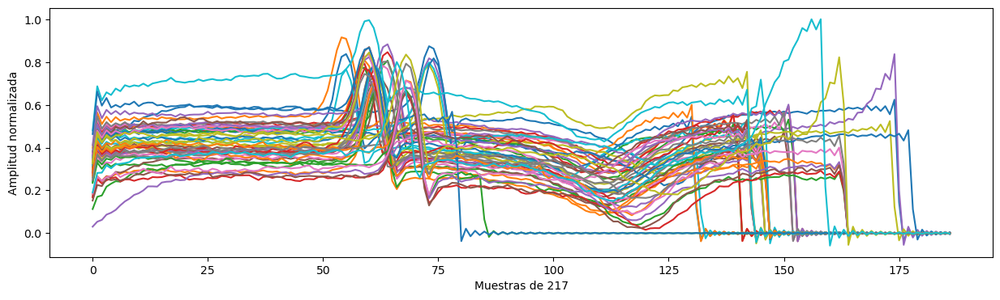

Conteo de etiquetas: Counter({'N': 2076, 'x': 133, 'V': 63, '+': 21, 'A': 7, '"': 4, 'F': 1})


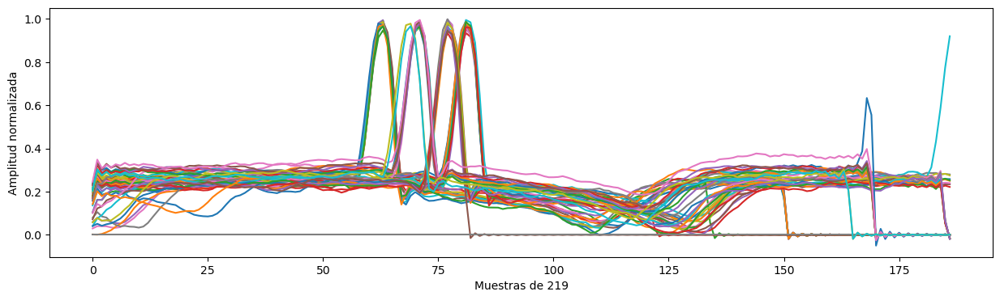

Conteo de etiquetas: Counter({'N': 1947, 'A': 94, '+': 17, '~': 4})


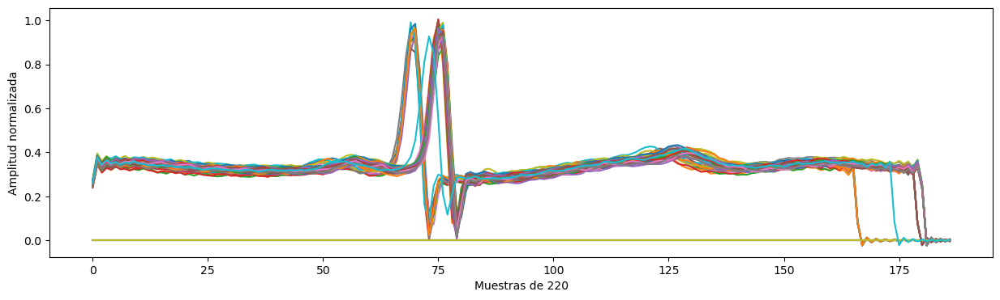

Conteo de etiquetas: Counter({'N': 2024, 'V': 396, '+': 23, '~': 12})


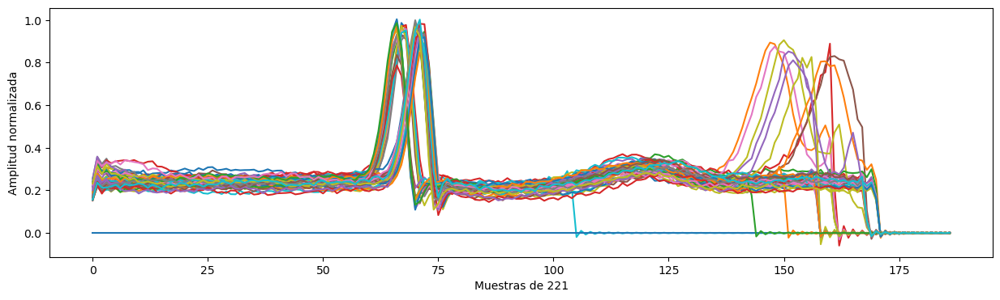

Conteo de etiquetas: Counter({'N': 2053, 'j': 212, 'A': 208, '+': 136, '~': 15, 'J': 1})


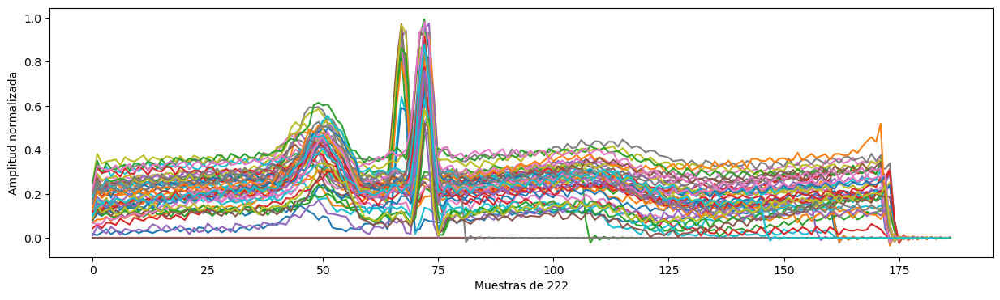

Conteo de etiquetas: Counter({'N': 2021, 'V': 473, 'A': 72, '+': 28, 'e': 16, 'F': 14, '~': 10, 'a': 1})


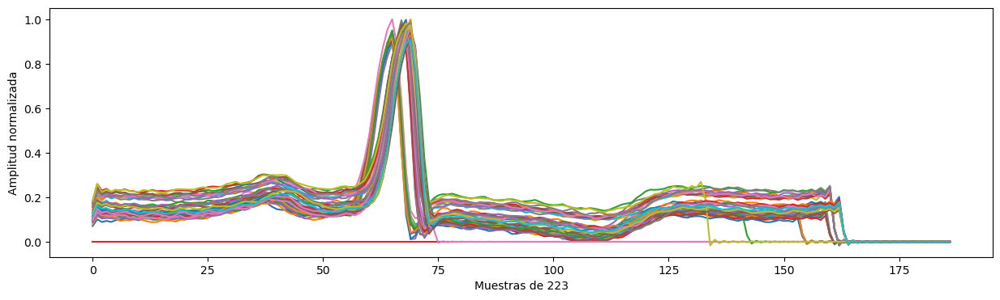

Conteo de etiquetas: Counter({'N': 1684, 'V': 360, '+': 41, '|': 24, '~': 20, 'A': 3, '"': 3})


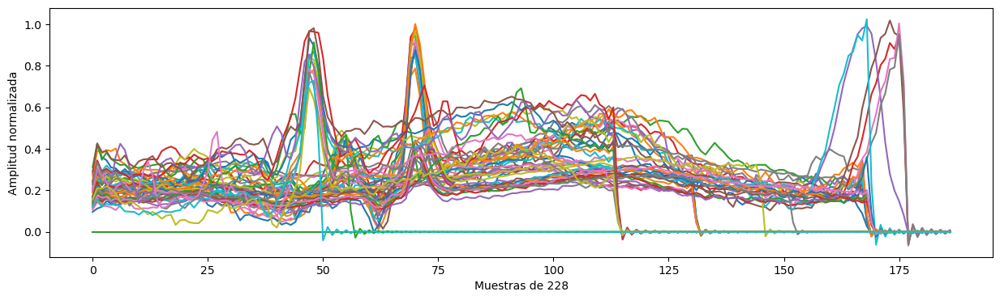

Conteo de etiquetas: Counter({'N': 2247, '+': 206, '~': 2, '|': 1, 'V': 1})


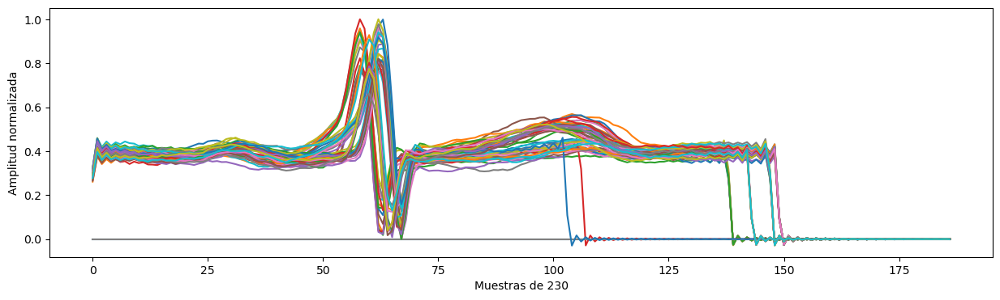

Conteo de etiquetas: Counter({'R': 1248, '"': 427, 'N': 314, '+': 11, 'x': 2, 'V': 2, 'A': 1})


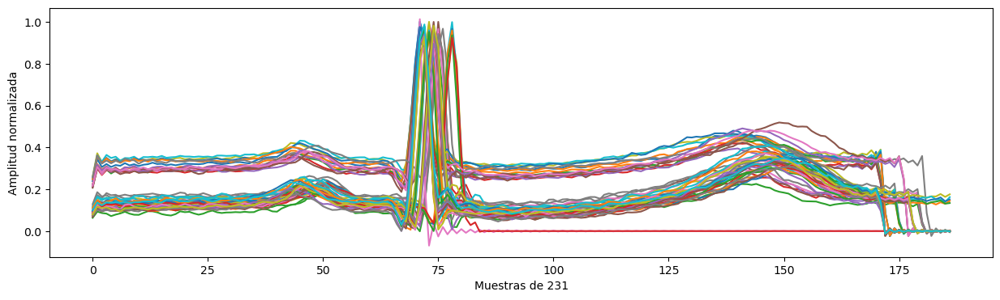

Conteo de etiquetas: Counter({'A': 1379, 'R': 396, '~': 35, '+': 1, 'j': 1})


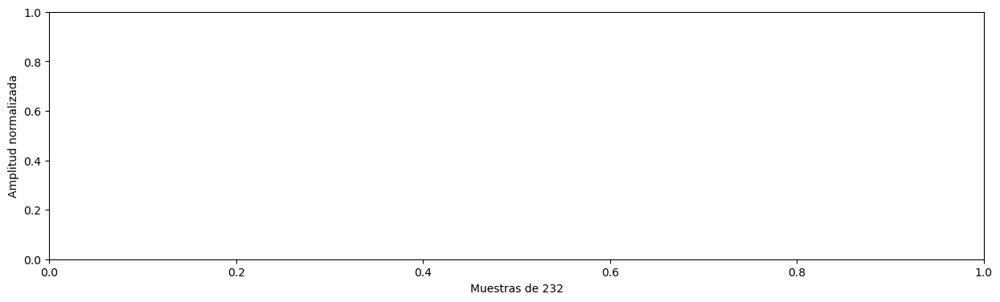

Conteo de etiquetas: Counter({'N': 2222, 'V': 829, '+': 71, 'F': 11, 'A': 7, '|': 2})


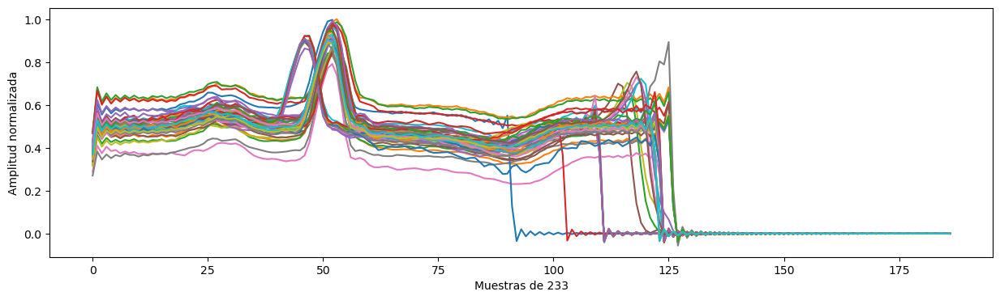

Conteo de etiquetas: Counter({'N': 2692, 'J': 50, '~': 8, '+': 3, 'V': 3})


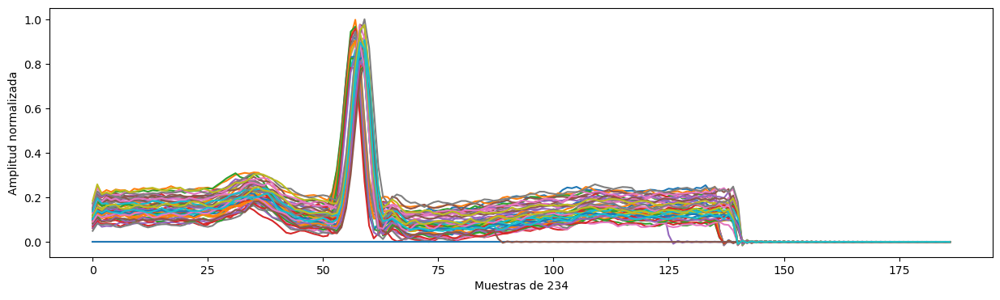

In [15]:
#se implementa un for para recorrer cada uno de los archivos
#disponibles

for f in lista_archivos:
    procesar(dataset_guardar, f, 50, 'N', 1.2, False)
    
#A continuación se muestra un extracto de 50 latidos de tipo 'N' para 
#cada uno de los archivos que se han procesado. 
#Los que están en blanco, significa que ese archivo no tiene latidos de la clase 'N'

**Se inicia con la limpieza del dataset**

In [16]:
#se cargan los latidos segmentados
segmentos = pd.read_csv(dataset_guardar, header=None)

In [17]:
print(segmentos.shape)

(112299, 188)


In [18]:
etiquetas = segmentos.iloc[:, -1]

In [19]:
label_counts = Counter(etiquetas)
print("Conteo de etiquetas:", label_counts)

Conteo de etiquetas: Counter({'N': 74804, 'L': 8055, 'R': 7241, 'V': 7116, '/': 7005, 'A': 2530, '+': 1289, 'f': 979, 'F': 802, '~': 615, '!': 472, '"': 437, 'j': 229, 'x': 192, 'a': 149, '|': 132, 'E': 106, 'J': 83, 'Q': 33, 'e': 16, '[': 6, ']': 6, 'S': 2})


**Agrupación para 5 clases**

Se procede con la agrupación de las clases MIT-BIH Class en las 5 clases AAMI que son 'N', 'S', 'V', 'F', 'Q'

**Se realiza el cambio de etiquetas*

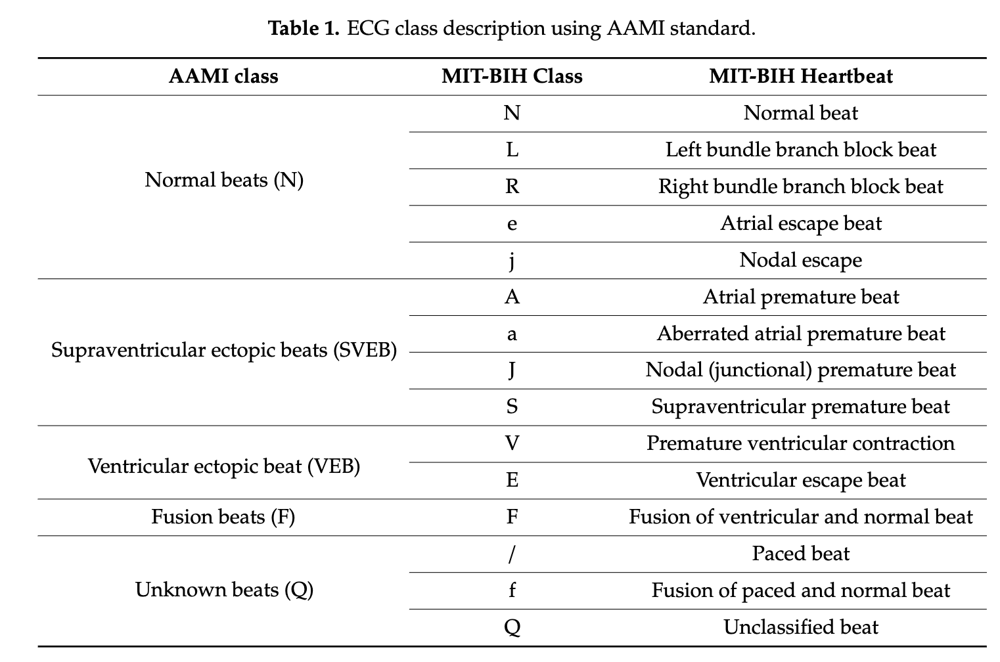

In [20]:
segmentos_etiq = reetiquetado(segmentos)
etiquetas2 = segmentos_etiq.iloc[:, -1]
label_counts = Counter(etiquetas2)
print("Conteo de etiquetas:", label_counts)

Conteo de etiquetas: Counter({'N': 90345, 'Q': 8017, 'V': 7222, nan: 3149, 'S': 2764, 'F': 802})


**Se eliminan las nan**

In [21]:
segmentos_etiq = segmentos_etiq.dropna(subset=[187])

In [22]:
etiquetas2 = segmentos_etiq.iloc[:, -1]

In [23]:
label_counts = Counter(etiquetas2)
print("Conteo de etiquetas:", label_counts)

Conteo de etiquetas: Counter({'N': 90345, 'Q': 8017, 'V': 7222, 'S': 2764, 'F': 802})


**Cambio de la etiqueta string por la codificación numérica**

Se realizará el cambio de etiquetas como sigue:
    
['N': 0, 'S': 1, 'V': 2, 'F': 3, 'Q': 4]

In [24]:
segmentos_etiq = etiqueta_numerica(segmentos_etiq)

/var/folders/rn/0xw3kvws3835x04f9_hby75w0000gn/T/ipykernel_60379/3433197765.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[187] = df[187].map(mapeo_numerico)


In [25]:
etiquetas2 = segmentos_etiq.iloc[:, -1]
label_counts = Counter(etiquetas2)
print("Conteo de etiquetas:", label_counts)

Conteo de etiquetas: Counter({0: 90345, 4: 8017, 2: 7222, 1: 2764, 3: 802})


**Revisa las filas con mayoria en ceros**

Se han  identificado que algunas filas de los latidos segmentados, son mayormente ceros. Estos segmentos no son representativos de un latido, por lo que se eliminarán del dataset.

El criterio para eliminarlos es si más del 90% de las 187 columnas tienen ceros,

In [26]:
segmentos_etiq['proporcion_ceros'] = segmentos_etiq.iloc[:, :-1].apply(proporcion_ceros, axis=1)


/var/folders/rn/0xw3kvws3835x04f9_hby75w0000gn/T/ipykernel_60379/423286726.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  segmentos_etiq['proporcion_ceros'] = segmentos_etiq.iloc[:, :-1].apply(proporcion_ceros, axis=1)


In [27]:
umbral_ceros = 0.9
segmentos_ceros = segmentos_etiq[segmentos_etiq['proporcion_ceros'] > umbral_ceros]


In [28]:
#Se verifica el número de filas con ceros
segmentos_ceros.shape

(4194, 189)

In [29]:
#se corrobora que el filtro haya sido correcto
segmentos_ceros

,0,1,2,3,4,5,6,7,8,9,...,179,180,181,182,183,184,185,186,187,proporcion_ceros
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0
38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0
50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0
75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0
112,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112119,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0
112134,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0
112149,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0
112224,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0


**Removemos las filas con ceros**

In [30]:
umbral_ceros = 0.9
segmentos_etiq = segmentos_etiq[segmentos_etiq['proporcion_ceros'] <= umbral_ceros]
segmentos_limpios = segmentos_etiq.drop(columns=['proporcion_ceros'])

In [31]:
segmentos_limpios.shape

(104956, 188)

In [32]:
#conteo de etiquetas después de eliminar los ceros
y_limpio = segmentos_limpios.iloc[:, -1]

clases_train = np.bincount(y_limpio)
print(f"Clase 0 : {clases_train[0]}")
print(f"Clase 1 : {clases_train[1]}")
print(f"Clase 2 : {clases_train[2]}")
print(f"Clase 3 : {clases_train[3]}")
print(f"Clase 4 : {clases_train[4]}")

Clase 0 : 86846
Clase 1 : 2647
Clase 2 : 6976
Clase 3 : 785
Clase 4 : 7702


**Salvamos el dataset depurado para el entrenamiento del modelo**

In [33]:
segmentos_limpios.to_csv('ds_depurado_mit_bih.csv', index=False, header=False)